In [5]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

import seaborn as sns

plt.style.use('seaborn')
sns.set(font_scale=2.5)
plt.rc("font", family="Malgun Gothic")
import missingno as msno

plt.rc('font', size=20)        # 기본 폰트 크기
plt.rc('axes', labelsize=20)   # x,y축 label 폰트 크기
plt.rc('xtick', labelsize=20)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=20)  # y축 눈금 폰트 크기
plt.rc('legend', fontsize=20)  # 범례 폰트 크기
plt.rc('figure', titlesize=50) # figure title 폰트 크기

# Python libraries
# Classic,data manipulation and linear algebra
import plotly.offline as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.tools as tls
import plotly.figure_factory as ff
py.init_notebook_mode(connected=True)
import squarify

# Data processing, metrics and modeling
from sklearn.model_selection import GridSearchCV, cross_val_score, train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import precision_score, recall_score, confusion_matrix,  roc_curve, precision_recall_curve, accuracy_score, roc_auc_score
import lightgbm as lgbm
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder, Binarizer
from sklearn.ensemble import VotingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve,auc, accuracy_score, roc_auc_score, f1_score, precision_score, recall_score
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_predict
from yellowbrick.classifier import DiscriminationThreshold

# Stats
import scipy.stats as ss
from scipy import interp
from scipy.stats import randint as sp_randint
from scipy.stats import uniform as sp_uniform

# Time
from contextlib import contextmanager
@contextmanager
def timer(title):
    t0 = time.time()
    yield
    print("{} - done in {:.0f}s".format(title, time.time() - t0))

#ignore warning messages 
import warnings
warnings.filterwarnings('ignore') 

# 1. Data 불러오기

## 1.1 Read data

In [2]:
df = pd.read_csv("./train.csv",encoding='UTF-8')

## 1.2 Data확인 

In [3]:
display(df.info(), df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60000 entries, 0 to 59999
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   id      60000 non-null  int64  
 1   나이      60000 non-null  int64  
 2   성별      60000 non-null  int64  
 3   키       60000 non-null  int64  
 4   몸무게     60000 non-null  float64
 5   수축기 혈압  60000 non-null  int64  
 6   이완기 혈압  60000 non-null  int64  
 7   콜레스테롤   60000 non-null  int64  
 8   포도당     60000 non-null  int64  
 9   흡연      60000 non-null  int64  
 10  음주      60000 non-null  int64  
 11  신체활동    60000 non-null  int64  
 12  label   60000 non-null  int64  
dtypes: float64(1), int64(12)
memory usage: 6.0 MB


None

,id,나이,성별,키,몸무게,수축기 혈압,이완기 혈압,콜레스테롤,포도당,흡연,음주,신체활동,label
0,0,18371,2,172,104.0,156,96,1,1,0,0,0,1
1,1,14455,1,164,62.0,110,70,1,1,0,0,1,0
2,2,17533,2,177,86.0,120,80,1,1,0,0,1,0
3,3,16010,2,175,88.0,120,80,1,1,0,0,1,1
4,4,16091,1,165,88.0,130,90,1,1,0,0,0,0


* 겉보기에 NULL 값은 없어 보인다.

## 1.3 Target label 분포 확인

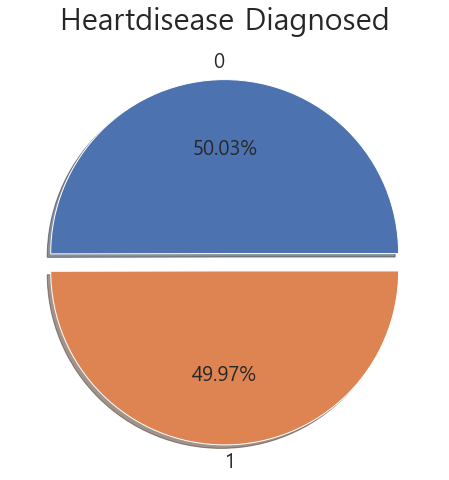

In [6]:
f, ax = plt.subplots(1, 1, figsize=(18, 8))
df['label'].value_counts().plot.pie(explode=[0, 0.1], autopct='%1.2f%%', ax=ax, shadow=True)
ax.set_title('Heartdisease Diagnosed')
ax.set_ylabel('')
plt.show()

* Target label의 분포는 거의 균등함을 확인할 수 있다.

# 2. Data 전처리

In [7]:
df.describe()

,id,나이,성별,키,몸무게,수축기 혈압,이완기 혈압,콜레스테롤,포도당,흡연,음주,신체활동,label
count,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000
mean,29999.500000,19468.299417,1.349317,164.356983,74.226097,129.134883,96.921717,1.366150,1.226883,0.087750,0.053517,0.804483,0.499700
std,17320.652413,2465.005682,0.476758,8.220935,14.398333,166.156717,193.061880,0.679234,0.572433,0.282933,0.225063,0.396601,0.500004
min,0.000000,10859.000000,1.000000,57.000000,10.000000,-150.000000,-70.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,14999.750000,17666.000000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,29999.500000,19702.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,44999.250000,21324.000000,2.000000,170.000000,82.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,59999.000000,23713.000000,2.000000,250.000000,200.000000,16020.000000,11000.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


### (1) id 
* "id"는 의미 없는 feature이므로 drop한다.

In [8]:
df.drop('id', axis=1, inplace=True) 

### (2) 나이
* 나이 데이터를 일수 -> 연수로 바꿔준다.
* 다른 문제는 없어 보인다.

In [9]:
df['나이'] = df['나이'] // 365

In [10]:
print('제일 나이 많은 환자 : {:.1f} Years'.format(df['나이'].max()))
print('제일 어린 환자 : {: .1f} Years'.format(df['나이'].min()))
print('환자 평균 나이 : {: .1f} Years'.format(df['나이'].mean()))

제일 나이 많은 환자 : 64.0 Years
제일 어린 환자 :  29.0 Years
환자 평균 나이 :  52.8 Years


### (2) 키, 몸무게
* Skewness(비대칭도) 낮아보임.
* 전반적으로 데이터에 오류가 없는 것 같음.
* 건드리지 않는다. 

In [11]:
df[['키', '몸무게']].describe()

,키,몸무게
count,60000.000000,60000.000000
mean,164.356983,74.226097
std,8.220935,14.398333
min,57.000000,10.000000
25%,159.000000,65.000000
50%,165.000000,72.000000
75%,170.000000,82.000000
max,250.000000,200.000000


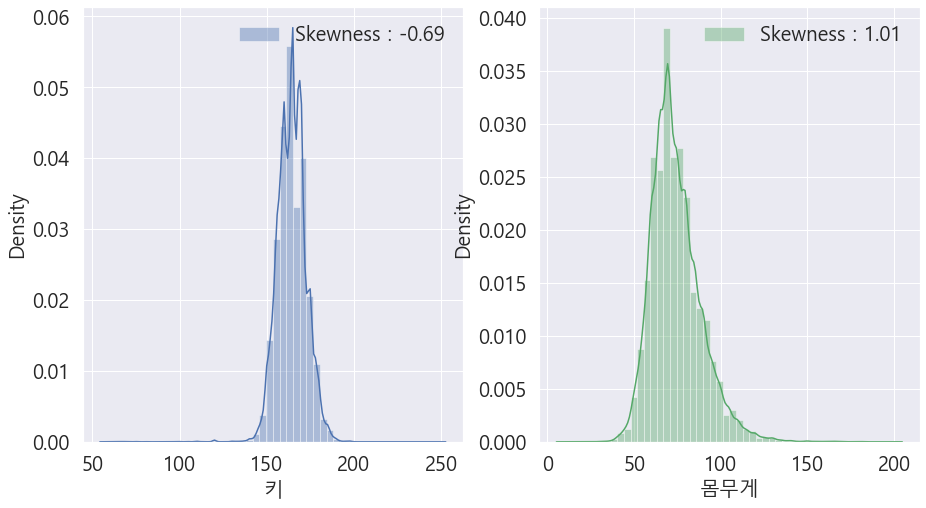

In [12]:
fig, ax = plt.subplots(1, 2, figsize=(15,8))
g1 = sns.distplot(df['키'], color='b', label='Skewness : {:.2f}'.format(df['키'].skew()), ax=ax[0])
g1 = g1.legend(loc='best')
g2 = sns.distplot(df['몸무게'], color='g', label='Skewness : {:.2f}'.format(df['몸무게'].skew()), ax=ax[1])
g2 = g2.legend(loc='best')

## (3) 수축기, 이완기 혈압
* 혈압이 과도하게 높게 측정된 환자들이 있다.
* 혈압이 음수로 측정된 환자들이 있다.
* 위 두 문제로 인해 Skewness(비대칭도)가 매우높다.

In [13]:
df[['수축기 혈압', '이완기 혈압']].describe()

,수축기 혈압,이완기 혈압
count,60000.000000,60000.000000
mean,129.134883,96.921717
std,166.156717,193.061880
min,-150.000000,-70.000000
25%,120.000000,80.000000
50%,120.000000,80.000000
75%,140.000000,90.000000
max,16020.000000,11000.000000


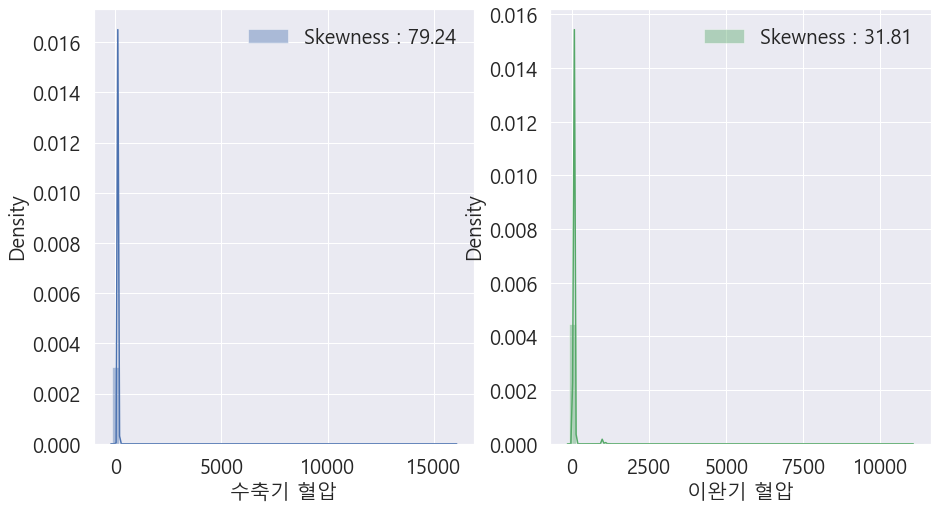

In [14]:
fig, ax = plt.subplots(1, 2, figsize=(15,8))
g1 = sns.distplot(df['수축기 혈압'], color='b', label='Skewness : {:.2f}'.format(df['수축기 혈압'].skew()), ax=ax[0])
g1 = g1.legend(loc='best')
g2 = sns.distplot(df['이완기 혈압'], color='g', label='Skewness : {:.2f}'.format(df['이완기 혈압'].skew()), ax=ax[1])
g2 = g2.legend(loc='best')

* 혈압이 300이상인 환자는 잘못 측정된걸로 판단한다.
* 혈압이 잘못 측정된 환자들이 실제로 고혈압이 였는지 확인하기 위해 혈압이 정상적으로 측정된 고혈압 환자들의 feature들과 비교하여 판단한다.
    * 고혈압이란 동맥의 압력을 기준으로 수축기혈압 140 mmHg 이상, 또는 이완기혈압(확장기혈압) 90 mmHg 이상인 경우를 뜻함.

In [15]:
df_수축기고혈압 = df[df['수축기 혈압'] > 140].describe()
df_수축기비정상 = df[df['수축기 혈압'] > 300].describe()

cp_df = pd.DataFrame ([df_수축기고혈압.iloc[1].to_list(), df_수축기비정상.iloc[1].to_list()], columns = df.columns.to_list())
cp_df

,나이,성별,키,몸무게,수축기 혈압,이완기 혈압,콜레스테롤,포도당,흡연,음주,신체활동,label
0,54.804725,1.379563,164.094861,80.249584,175.815594,166.257649,1.559126,1.298405,0.096279,0.067336,0.815948,0.860957
1,51.948718,1.307692,164.846154,70.435897,3943.461538,68.205128,1.410256,1.179487,0.000000,0.051282,0.897436,0.641026


* 수축기 혈압의 경우 연관성이 없어 보이므로 정상 혈압 측정 환자들의 평균값으로 변경 해준다.
* 혈압이 음수인 환자들도 평균값으로 변경 해준다.

In [16]:
df_수축기정상mean = df[df['수축기 혈압'] <= 300]['수축기 혈압'].mean()

def ap(x) :
  if x > 300 or x <= 0:
    return df_수축기정상mean
  return x

df['수축기 혈압']=df['수축기 혈압'].apply(ap)


* 이완기 혈압의 경우 고혈압 환자와 유사한 feature 특성을 보이므로 정상 (고)혈압 측정 환자들의 평균값으로 변경 해 준다.
* 혈압이 음수인 환자의 경우 정상 측정 환자들의 평균값으로 변경 해준다.

In [17]:
df_이완기고혈압 = df[df['이완기 혈압'] > 90].describe()
df_이완기비정상 = df[df['이완기 혈압'] > 300].describe()

cp_df = pd.DataFrame ([df_이완기고혈압.iloc[1].to_list(), df_이완기비정상.iloc[1].to_list()], columns = df.columns.to_list())
cp_df

,나이,성별,키,몸무게,수축기 혈압,이완기 혈압,콜레스테롤,포도당,흡연,음주,신체활동,label
0,54.174521,1.398084,164.271073,81.509368,154.317684,278.419923,1.589655,1.310536,0.102107,0.078736,0.807088,0.832950
1,53.895758,1.402424,164.230303,80.537939,154.560000,1217.060606,1.550303,1.277576,0.106667,0.070303,0.830303,0.843636


In [18]:
df_이완기고혈압mean = df[df['이완기 혈압'] > 90]
df_이완기고혈압mean = df_이완기고혈압mean[df_이완기고혈압mean['이완기 혈압'] <= 300]['이완기 혈압'].mean()
df_이완기정상mean = df[df['이완기 혈압'] <= 300]['이완기 혈압'].mean()
def ap(x) :
  if x > 300:
    return df_이완기고혈압mean
  elif x <= 0:
        return df_이완기정상mean
  return x

df['이완기 혈압']=df['이완기 혈압'].apply(ap)

* 수축기, 이완기 혈압의 Skewness(비대칭도)가 낮아졌음을 확인할 수 있다.

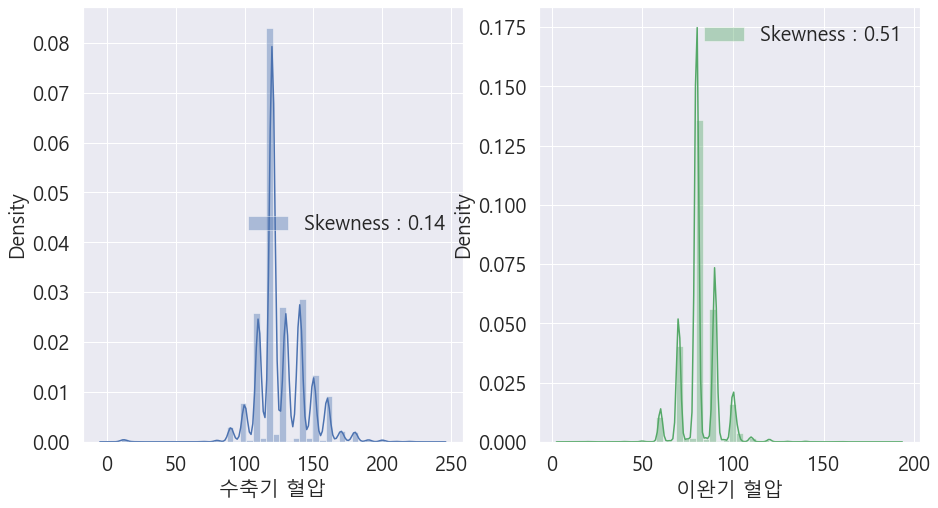

In [19]:
fig, ax = plt.subplots(1, 2, figsize=(15,8))
g1 = sns.distplot(df['수축기 혈압'], color='b', label='Skewness : {:.2f}'.format(df['수축기 혈압'].skew()), ax=ax[0])
g1 = g1.legend(loc='best')
g2 = sns.distplot(df['이완기 혈압'], color='g', label='Skewness : {:.2f}'.format(df['이완기 혈압'].skew()), ax=ax[1])
g2 = g2.legend(loc='best')

# 3. Feature 추가

## 3.1 BMI  추가
* "Nurses' Health Study"에 따르면 BMI가 일정 기준 이상 높을 수록 관동맥질환 발생위험이 증가한다고 한다.
* 키, 몸무게 feature 를 이용하여 BMI feature를 추가한다.

In [20]:
df.insert(2, 'bmi',(df['몸무게'] // (df['키'] * df['키'] * 0.01 * 0.01)))

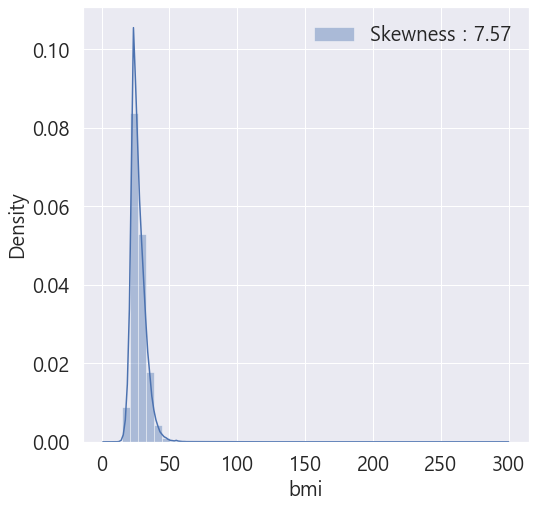

In [21]:
fig, ax = plt.subplots(1, 1, figsize=(8,8))
g = sns.distplot(df['bmi'], color='b', label='Skewness : {:.2f}'.format(df['bmi'].skew()), ax=ax)
g = g.legend(loc='best')

# 4. Exploratory Data analysis

* Feature Correlation Matrix

In [22]:
def correlation_plot():

    correlation = df.corr()

    matrix_cols = correlation.columns.tolist()

    corr_array  = np.array(correlation)
    trace = go.Heatmap(z = corr_array,
                       x = matrix_cols,
                       y = matrix_cols,
                       colorscale='Viridis',
                       colorbar   = dict() ,
                      )
    layout = go.Layout(dict(title = 'Correlation Matrix for variables',
                            #autosize = False,
                            #height  = 1400,
                            #width   = 1600,
                            margin  = dict(r = 0 ,l = 100,
                                           t = 0,b = 100,
                                         ),
                            yaxis   = dict(tickfont = dict(size = 9)),
                            xaxis   = dict(tickfont = dict(size = 9)),
                           )
                      )
    fig = go.Figure(data = [trace],layout = layout)
    py.iplot(fig)
correlation_plot()

## 4.1 흡연

* 비흡연자 환자가 훨씬 많다.
* 흡연 유무만으로는 심장병 진단 유무와의 명확한 관계가 보이지 않는다.

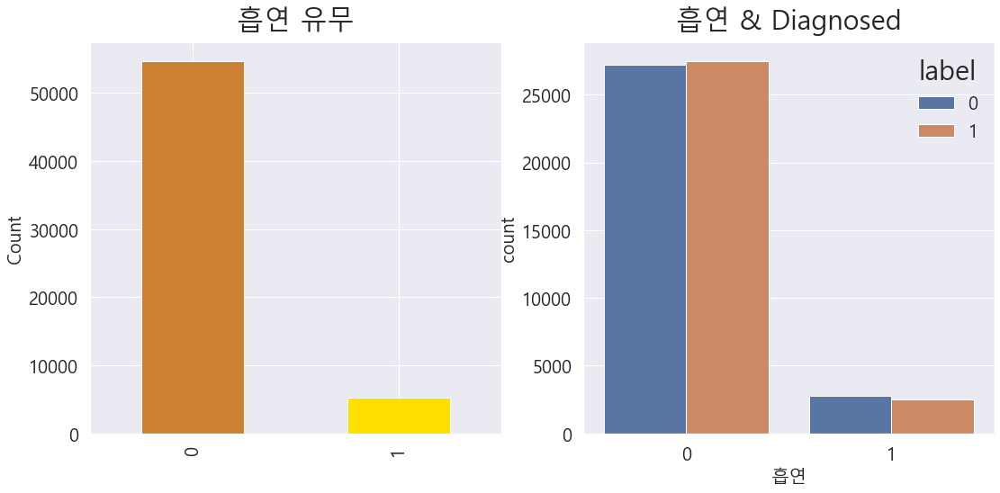

In [23]:
y_position = 1.02
f, ax = plt.subplots(1, 2, figsize=(18, 8))
df['흡연'].value_counts().plot.bar(color= ['#CD7F32','#FFDF00','#D3D3D3'], ax=ax[0]) 
ax[0].set_title('흡연 유무', y=y_position)
ax[0].set_ylabel('Count')
sns.countplot('흡연', hue='label', data=df, ax=ax[1])  
ax[1].set_title('흡연 & Diagnosed', y = y_position)
plt.show()

## 4.2 음주

* 음주 하지 않는 환자가 훨씬 많다.
* 음주 유무만으로는 심장병 진단 유무와의 명확한 관계가 보이지 않는다.

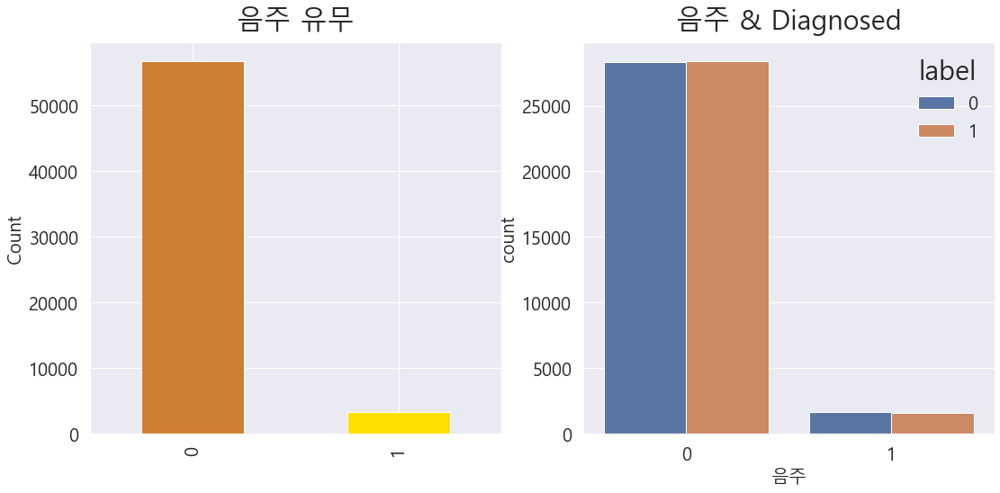

In [24]:
y_position = 1.02
f, ax = plt.subplots(1, 2, figsize=(18, 8))
df['음주'].value_counts().plot.bar(color= ['#CD7F32','#FFDF00','#D3D3D3'], ax=ax[0]) 
ax[0].set_title('음주 유무', y=y_position)
ax[0].set_ylabel('Count')
sns.countplot('음주', hue='label', data=df, ax=ax[1])  
ax[1].set_title('음주 & Diagnosed', y = y_position)
plt.show()

## 4.3 신체활동
* 환자 대부분 운동을 한다.
* 운동을 하는 환자 집단이 심장병 진단 비율이 살짝 낮다.

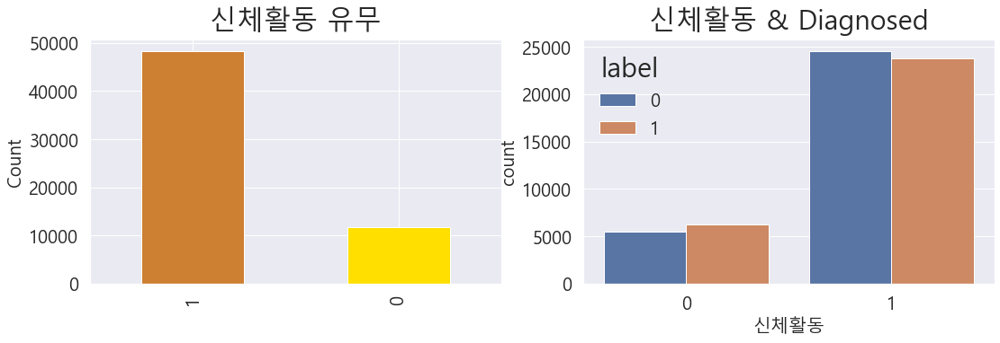

In [25]:
y_position = 1.02
f, ax = plt.subplots(1, 2, figsize=(18, 5))
df['신체활동'].value_counts().plot.bar(color= ['#CD7F32','#FFDF00','#D3D3D3'], ax=ax[0]) 
ax[0].set_title('신체활동 유무', y=y_position)
ax[0].set_ylabel('Count')
sns.countplot('신체활동', hue='label', data=df, ax=ax[1]) 
ax[1].set_title('신체활동 & Diagnosed', y = y_position)
plt.show()

## 4.4 Age
* 고령의 환자 일수록 심장병을 진단 받을 가능성이 높음을 알 수 있다.
* 50 대 초중반 이후로 진단 비율이 역전됨을 확인 할 수 있다.

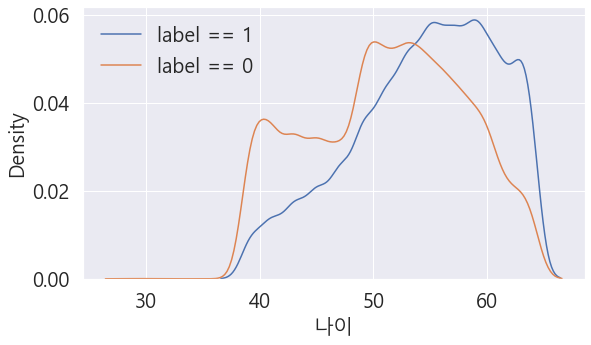

In [26]:
fig, ax = plt.subplots(1,1, figsize=(9,5))
sns.kdeplot(df[df['label']==1]['나이'], ax = ax)
sns.kdeplot(df[df['label']==0]['나이'], ax = ax)
plt.legend(['label == 1', 'label == 0'])
plt.show()

## 4.5 수축기, 이완기 혈압
* 수축기, 이완기 혈압 모두 고혈압의 경우 심장병 진단 가능성이 급증함을 확인 할 수 있다.

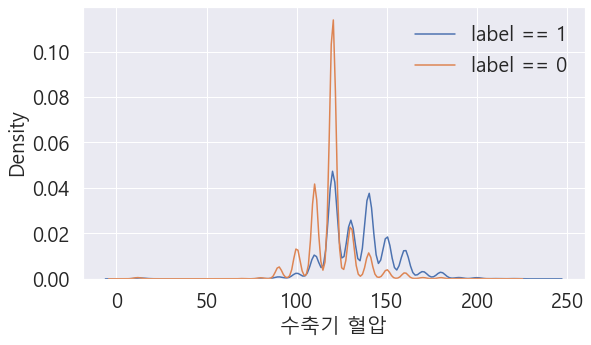

In [27]:
fig, ax = plt.subplots(1,1, figsize=(9,5))
sns.kdeplot(df[df['label']==1]['수축기 혈압'], ax = ax)
sns.kdeplot(df[df['label']==0]['수축기 혈압'], ax = ax)
plt.legend(['label == 1', 'label == 0'])
plt.show()

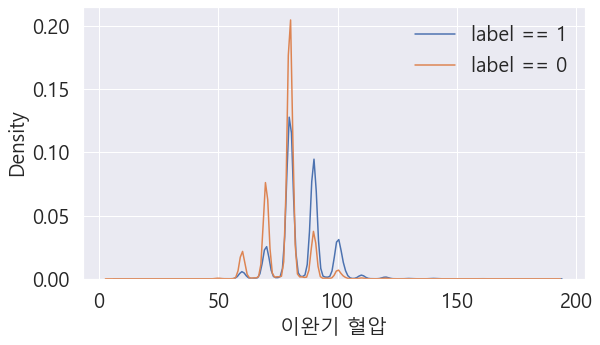

In [28]:
fig, ax = plt.subplots(1,1, figsize=(9,5))
sns.kdeplot(df[df['label']==1]['이완기 혈압'], ax = ax)
sns.kdeplot(df[df['label']==0]['이완기 혈압'], ax = ax)
plt.legend(['label == 1', 'label == 0'])
plt.show()

# 5. DataSet, Functions 준비 

## 5.1 StandarScaler and Label Encoder
* StandardScaler : 연속 변수 feature data들의 평균 크기가 불균등하므로 feature들을 표준화 해준다.
* 이항 feature: 흡연, 음주, 신체활동은 건드리지 않는다.
* Label Encoder: 이산 변수 feature들을 0 ~ n_classes-1로 encoding 해준다.

In [29]:
target_col = ["label"]
cat_cols   = df.nunique()[df.nunique() < 10].keys().tolist()
cat_cols   = [x for x in cat_cols ]
#연속feature columns
num_cols   = [x for x in df.columns if x not in cat_cols + target_col]
#이항feature columns
bin_cols   = df.nunique()[df.nunique() == 2].keys().tolist()
#이산feature columns
multi_cols = [i for i in cat_cols if i not in bin_cols]

#Label encoding 
le = LabelEncoder()
for i in bin_cols :
    df[i] = le.fit_transform(df[i])
    
df = pd.get_dummies(data = df, columns = multi_cols )

#StandarScaler
std = StandardScaler()
scaled = std.fit_transform(df[num_cols])
scaled = pd.DataFrame(scaled,columns=num_cols)

df_data_og = df.copy()
df = df.drop(columns = num_cols,axis = 1)
df = df.merge(scaled,left_index=True,right_index=True,how = "left")

df=df[['성별', '흡연', '음주', '신체활동', '콜레스테롤_1', '콜레스테롤_2', '콜레스테롤_3','포도당_1', '포도당_2', '포도당_3', '나이', 'bmi', '키', '몸무게', '수축기 혈압', '이완기 혈압', 'label']]


## 5.2 X, y 분리 / train, test Data 분리
* 학습을 위해 input(X), output(y) 분리
* train, test Data 분리

In [30]:
X = df.drop('label', 1)
y = df['label']


In [31]:
# train / test data 분리함수
def get_train_test_dataset(df=None):
  
  X_features = df.iloc[:, :-1]
  y_target = df.iloc[:, -1]

  X_train, X_test, y_train, y_test = \
  train_test_split(X_features, y_target, test_size=0.2, random_state=123, stratify=y_target)
  return X_train, X_test, y_train, y_test

X_train, X_test, y_train, y_test = get_train_test_dataset(df)
X_train.index = list(range(0,48000))
y_train.index = list(range(0,48000))
X_test.index = list(range(0,12000))
y_test.index = list(range(0,12000))

## 5.3 성능분석을 위한 함수
* cross validation K-Fold를 이용하여 성능분석

In [32]:
# Train model performance 함수1
def model_performance(model, subtitle) :   
    #Kfold
    cv = KFold(n_splits=5,shuffle=False)
    y_real = []
    y_proba = []
    tprs = []
    aucs = []
    mean_fpr = np.linspace(0,1,100)
    i = 1
    
    for train,test in cv.split(X_train,y_train):
        model.fit(X_train.iloc[train], y_train.iloc[train])
        pred_proba = model.predict_proba(X_train.iloc[test])
        
         
        
        precision, recall, _ = precision_recall_curve(y_train.iloc[test], pred_proba[:,1])
        y_real.append(y_train.iloc[test])
        y_proba.append(pred_proba[:,1])
        fpr, tpr, t = roc_curve(y_train[test], pred_proba[:, 1])
        tprs.append(interp(mean_fpr, fpr, tpr))
        roc_auc = auc(fpr, tpr)
        aucs.append(roc_auc) 
    
    # Confusion matrix
    y_pred = cross_val_predict(model, X_train, y_train, cv=5)
    conf_matrix = confusion_matrix(y_train, y_pred)
    trace1 = go.Heatmap(z = conf_matrix  ,x = ["0 (pred)","1 (pred)"],
                        y = ["0 (true)","1 (true)"],xgap = 2, ygap = 2, 
                        colorscale = 'Viridis', showscale  = False)
    
    #Show metrics
    tp = conf_matrix[1,1]
    fn = conf_matrix[1,0]
    fp = conf_matrix[0,1]
    tn = conf_matrix[0,0]
    Accuracy  =  ((tp+tn)/(tp+tn+fp+fn))
    Precision =  (tp/(tp+fp))
    Recall    =  (tp/(tp+fn))
    F1_score  =  (2*(((tp/(tp+fp))*(tp/(tp+fn)))/((tp/(tp+fp))+(tp/(tp+fn)))))

    show_metrics = pd.DataFrame(data=[[Accuracy , Precision, Recall, F1_score]])
    show_metrics = show_metrics.T

    colors = ['gold', 'lightgreen', 'lightcoral', 'lightskyblue']
    trace2 = go.Bar(x = (show_metrics[0].values), 
                    y = ['Accuracy', 'Precision', 'Recall', 'F1_score'], text = np.round_(show_metrics[0].values,4),
                    textposition = 'auto', textfont=dict(color='black'),
                    orientation = 'h', opacity = 1, marker=dict(
            color=colors,
            line=dict(color='#000000',width=1.5)))

    #Roc curve
    mean_tpr = np.mean(tprs, axis=0)
    mean_auc = auc(mean_fpr, mean_tpr)

    trace3 = go.Scatter(x=mean_fpr, y=mean_tpr,
                        name = "Roc : " ,
                        line = dict(color = ('rgb(22, 96, 167)'),width = 2), fill='tozeroy')
    trace4 = go.Scatter(x = [0,1],y = [0,1],
                        line = dict(color = ('black'),width = 1.5,
                        dash = 'dot'))
    
    #Precision - recall curve
    y_real = y_train
    y_proba = np.concatenate(y_proba)
    precision, recall, _ = precision_recall_curve(y_real, y_proba)

    trace5 = go.Scatter(x = recall, y = precision,
                        name = "Precision" + str(precision),
                        line = dict(color = ('lightcoral'),width = 2), fill='tozeroy')
    
    mean_auc=round(mean_auc,3)
    #Subplots
    fig = tls.make_subplots(rows=2, cols=2, print_grid=False,
                          specs=[[{}, {}], 
                                 [{}, {}]],
                          subplot_titles=('Confusion Matrix',
                                          'Metrics',
                                          'ROC curve'+" "+ '('+ str(mean_auc)+')',
                                          'Precision - Recall curve',
                                          ))
    #Trace and layout
    fig.append_trace(trace1,1,1)
    fig.append_trace(trace2,1,2)
    fig.append_trace(trace3,2,1)
    fig.append_trace(trace4,2,1)
    fig.append_trace(trace5,2,2)
    
    fig['layout'].update(showlegend = False, title = '<b>Model performance report (5 folds)</b><br>'+subtitle,
                        autosize = False, height = 830, width = 830,
                        plot_bgcolor = 'black',
                        paper_bgcolor = 'black',
                        margin = dict(b = 195), font=dict(color='white'))
    fig["layout"]["xaxis1"].update(color = 'white')
    fig["layout"]["yaxis1"].update(color = 'white')
    fig["layout"]["xaxis2"].update((dict(range=[0, 1], color = 'white')))
    fig["layout"]["yaxis2"].update(color = 'white')
    fig["layout"]["xaxis3"].update(dict(title = "false positive rate"), color = 'white')
    fig["layout"]["yaxis3"].update(dict(title = "true positive rate"),color = 'white')
    fig["layout"]["xaxis4"].update(dict(title = "recall"), range = [0,1.05],color = 'white')
    fig["layout"]["yaxis4"].update(dict(title = "precision"), range = [0,1.05],color = 'white')
    for i in fig['layout']['annotations']:
        i['font'] = titlefont=dict(color='white', size = 14)
    py.iplot(fig)

In [33]:
# Train model performance 함수2
def scores_table(model, subtitle):
    scores = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']
    res = []
    for sc in scores:
        scores = cross_val_score(model, X_train, y_train, cv = 5, scoring = sc)
        res.append(scores)
    df = pd.DataFrame(res).T
    df.loc['mean'] = df.mean()
    df.loc['std'] = df.std()
    df= df.rename(columns={0: 'accuracy', 1:'precision', 2:'recall',3:'f1',4:'roc_auc'})

    trace = go.Table(
        header=dict(values=['<b>Fold', '<b>Accuracy', '<b>Precision', '<b>Recall', '<b>F1 score', '<b>Roc auc'],
                    line = dict(color='#7D7F80'),
                    fill = dict(color='#a1c3d1'),
                    align = ['center'],
                    font = dict(size = 15)),
        cells=dict(values=[('1','2','3','4','5','mean', 'std'),
                           np.round(df['accuracy'],3),
                           np.round(df['precision'],3),
                           np.round(df['recall'],3),
                           np.round(df['f1'],3),
                           np.round(df['roc_auc'],3)],
                   line = dict(color='#7D7F80'),
                   fill = dict(color='#EDFAFF'),
                   align = ['center'], font = dict(size = 15)))

    layout = dict(width=800, height=400, title = '<b>Cross Validation - 5 folds</b><br>'+subtitle, font = dict(size = 15))
    fig = dict(data=[trace], layout=layout)

    py.iplot(fig, filename = 'styled_table')

In [34]:
# 최종 test 데이터 성능지표 함수
def get_clf_eval(y_test, pred=None, pred_proba=None):
  confusion = confusion_matrix(y_test, pred)
  accuracy = accuracy_score(y_test, pred)
  precision = precision_score(y_test, pred)
  recall = recall_score(y_test, pred)
  f1 = f1_score(y_test, pred)
  roc_auc = roc_auc_score(y_test, pred_proba)
 
  print('정확도: {0:4f}, 정밀도: {1:4f}, 재현율:{2:4f}, F1:{3:.4f}, AUC:{4: .4f}'.format(accuracy, precision, recall, f1, roc_auc))

from sklearn.preprocessing import Binarizer
def get_eval_by_threshold(y_test , pred_proba_c1, thresholds):
    binarizer = Binarizer(threshold=thresholds).fit(pred_proba_c1) 
    custom_predict = binarizer.transform(pred_proba_c1)
    get_clf_eval(y_test , custom_predict, pred_proba_c1)
        
def get_model_train_eval(model, thresholds, ftr_train=None, ftr_test=None,
                         tgt_train=None, tgt_test=None):
  model.fit(ftr_train, tgt_train)
  pred = model.predict(ftr_test)
  pred_proba = model.predict_proba(ftr_test)[:, 1].reshape(-1,1)
  get_eval_by_threshold(tgt_test, pred_proba, thresholds) 


# 6. 다양한 모델 학습

## 6.1 Randomforest

* 하이퍼파라미터 최적화

In [36]:
rf_clf = RandomForestClassifier(random_state=123)

param_test = {'n_estimators': [100, 300, 500],
                'max_depth':[2,3,5,10], 
                'min_samples_split':[2,3,5], 
                'min_samples_leaf':[1,5,8], 
                'max_features':[10]}

grid_search = RandomizedSearchCV(
    estimator=rf_clf, param_distributions=param_test, 
    scoring='f1',
    cv=3,
    refit=True,
    verbose=True)

grid_search.fit(X, y)
opt_parameters =  grid_search.best_params_
rf_clf = RandomForestClassifier(**opt_parameters)

Fitting 3 folds for each of 3 candidates, totalling 9 fits


* 성능 분석

In [39]:
model_performance(rf_clf, 'RFClassifier')
scores_table(rf_clf, 'RFClassfier')

* Threshold 찾기

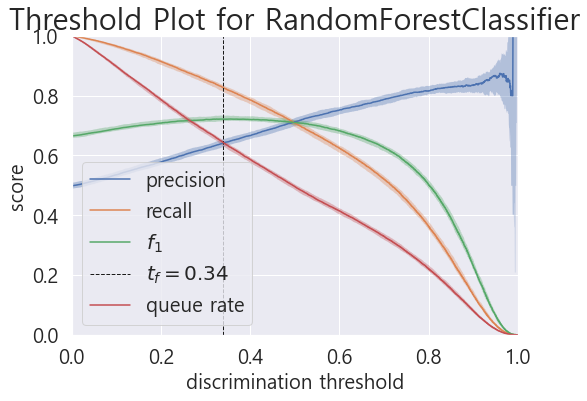

<AxesSubplot:title={'center':'Threshold Plot for RandomForestClassifier'}, xlabel='discrimination threshold', ylabel='score'>

In [41]:
visualizer = DiscriminationThreshold(rf_clf)

visualizer.fit(X_train, y_train)  
visualizer.poof()

In [42]:
print("RFClassifier test데이터 성능")    
get_model_train_eval(rf_clf, 0.34, X_train, X_test, y_train, y_test)

RFClassifier test데이터 성능
정확도: 0.686833, 정밀도: 0.645589, 재현율:0.827552, F1:0.7253, AUC: 0.7763


## 6.2 XGBClassifier

In [43]:
from xgboost import XGBClassifier
xgb_wrapper = XGBClassifier(learning_rate=0.09,  max_depth=4, random_state=123)

xgb_wrapper = XGBClassifier(random_state=123)



In [46]:
param_test = {'learning_rate' : [0.01, 0.02, 0.03, 0.04, 0.05, 0.08, 0.09, 0.1, 0.2, 0.3],
              'max_depth':[3, 4, 5, 6, 7],
               'eta':[0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6], 
              'sub_sample':[0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
              'colsample_bytree': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]}


grid_search = RandomizedSearchCV(
    estimator= xgb_wrapper, param_distributions=param_test, 
    scoring='f1',
    cv=3,
    refit=True,
    verbose=True)

grid_search.fit(X, y, **fit_params)
opt_parameters =  grid_search.best_params_
xgb_wrapper = XGBClassifier(**opt_parameters)

In [47]:
model_performance(xgb_wrapper, 'XGBClassifier')
scores_table(xgb_wrapper, 'XGBClassfier')

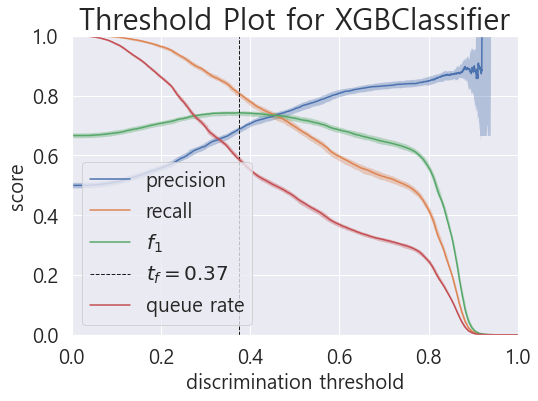

<AxesSubplot:title={'center':'Threshold Plot for XGBClassifier'}, xlabel='discrimination threshold', ylabel='score'>

In [48]:
visualizer = DiscriminationThreshold(xgb_wrapper)

visualizer.fit(X_train, y_train)  
visualizer.poof()

In [49]:
print("XGBClassifier test데이터 성능")    
get_model_train_eval(xgb_wrapper, 0.37, X_train, X_test, y_train, y_test)

XGBClassifier test데이터 성능
정확도: 0.724167, 정밀도: 0.690659, 재현율:0.811374, F1:0.7462, AUC: 0.8085


## 6.3 LGBMClassifier

In [51]:
lgbm_clf = lgbm.LGBMClassifier(random_state=random_state, silent=True, metric='None', n_jobs=4)

In [53]:
fit_params = {"early_stopping_rounds" : 100, 
             "eval_metric" : 'auc', 
             "eval_set" : [(X_train,y_train)],
             'eval_names': ['valid'],
             'verbose': 0,
             'categorical_feature': 'auto'}

param_test = {'learning_rate' : [0.01, 0.02, 0.03, 0.04, 0.05, 0.08, 0.1, 0.2, 0.3, 0.4],
               'n_estimators' : [100, 200, 300, 400, 500, 600, 800, 1000, 1500, 2000]}
              'num_leaves': sp_randint(6, 50), 
              'min_child_samples': sp_randint(100, 500), 
              'min_child_weight': [1e-5, 1e-3, 1e-2, 1e-1, 1, 1e1, 1e2, 1e3, 1e4],
              'subsample': sp_uniform(loc=0.2, scale=0.8), 
              'max_depth': [-1, 1, 2, 3, 4, 5, 6, 7],
              'colsample_bytree': sp_uniform(loc=0.4, scale=0.6),
              'reg_alpha': [0, 1e-1, 1, 2, 5, 7, 10, 50, 100],
              'reg_lambda': [0, 1e-1, 1, 5, 10, 20, 50, 100]}


n_iter = 300

grid_search = RandomizedSearchCV(
    estimator=lgbm_clf, param_distributions=param_test, 
    n_iter=n_iter,
    scoring='f1',
    cv=5,
    refit=True,
    random_state=random_state,
    verbose=True)

grid_search.fit(X, y, **fit_params)
opt_parameters =  grid_search.best_params_
lgbm_clf = lgbm.LGBMClassifier(**opt_parameters)

In [52]:
model_performance(lgbm_clf, 'LightGBM')
scores_table(lgbm_clf, 'LightGBM')

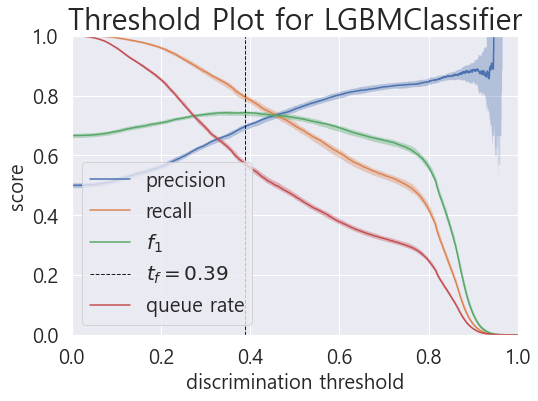

<AxesSubplot:title={'center':'Threshold Plot for LGBMClassifier'}, xlabel='discrimination threshold', ylabel='score'>

In [54]:
visualizer = DiscriminationThreshold(lgbm_clf)

visualizer.fit(X, y)  
visualizer.poof()

In [155]:
print("LGBMClassifier test데이터 성능")    
get_model_train_eval(lgbm_clf, 0.35, X_train, X_test, y_train, y_test)

LGBMClassifier test데이터 성능
정확도: 0.713083, 정밀도: 0.670815, 재현율:0.836057, F1:0.7444, AUC: 0.8077


In [ ]:
print("LGBMlassifier test데이터 성능")    
get_model_train_eval(lgbm_clf, 0.38, X_train, X_test, y_train, y_test)